In [1]:
import numpy as np
import cv2
import os
import random
from IPython.display import clear_output
import matplotlib.pyplot as plt
%matplotlib inline

import torch
from torch import optim
from torch.utils.data import DataLoader
from torch.autograd import Variable

from dataset import Data
from model import GAN
from utils import count_parameters, gen_show_imgs, save_model

In [2]:
torch.backends.cudnn.benchmark = True
batch_size=64
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)

In [3]:
# load data
data = Data()
training_data = DataLoader(data, batch_size=batch_size, collate_fn=data.collate_fn, drop_last=True, shuffle=True)

# load model
model = GAN().cuda()

Loading dataset
33431 images


In [4]:
model.summary()


generator 5567873 params
Generator(
  (inp): Sequential(
    (0): Linear(in_features=129, out_features=36864, bias=True)
  )
  (conv): Sequential(
    (0): ReLU()
    (1): Stack(
      (layer): Sequential(
        (0): Sequential(
          (0): Residual(
            (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (1): ReLU()
            (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
        )
        (1): Sequential(
          (0): Residual(
            (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (1): ReLU()
            (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
        )
        (2): Sequential(
          (0): Residual(
            (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (1): ReLU()
            (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
        )
       

[Epoch   0] DL: 1.34, GL: 1.04, DR: 0.52, GR: 0.41, TI: 0.03, GI: 0.08


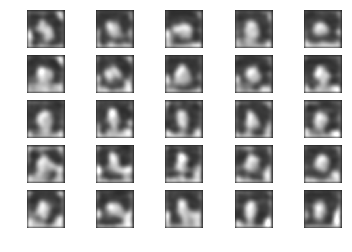

[Epoch   1] DL: 1.23, GL: 0.77, DR: 0.68, GR: 0.53, TI: 0.04, GI: 0.07


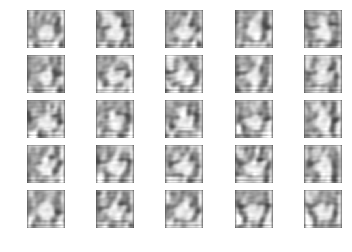

[Epoch   2] DL: 1.58, GL: 5.50, DR: 0.50, GR: 0.18, TI: 0.02, GI: 0.30


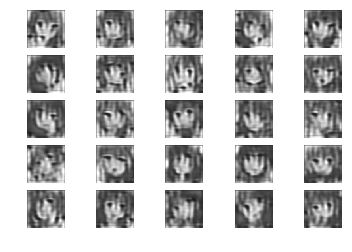

[Epoch   3] DL: 1.09, GL: 0.76, DR: 0.65, GR: 0.55, TI: 0.02, GI: 0.14


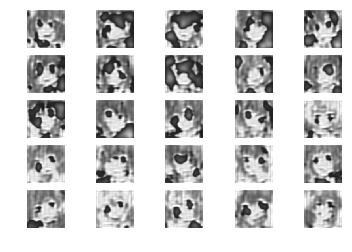

[Epoch   4] DL: 1.07, GL: 0.82, DR: 0.64, GR: 0.49, TI: 0.01, GI: 0.07


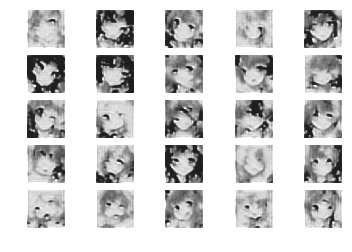

[Epoch   5] DL: 1.08, GL: 0.73, DR: 0.63, GR: 0.53, TI: 0.01, GI: 0.06


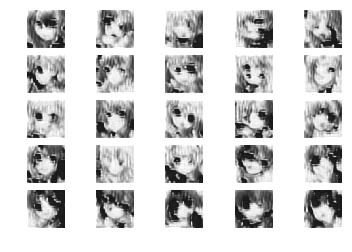

[Epoch   6] DL: 1.07, GL: 0.84, DR: 0.63, GR: 0.48, TI: 0.01, GI: 0.07


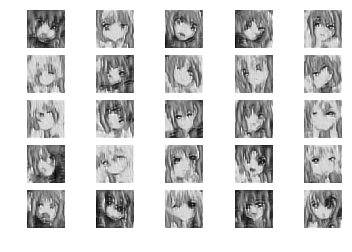

[Epoch   7] DL: 1.07, GL: 0.90, DR: 0.60, GR: 0.46, TI: 0.01, GI: 0.08


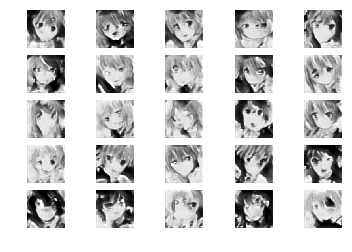

[Epoch   8] DL: 1.15, GL: 0.84, DR: 0.62, GR: 0.49, TI: 0.01, GI: 0.07


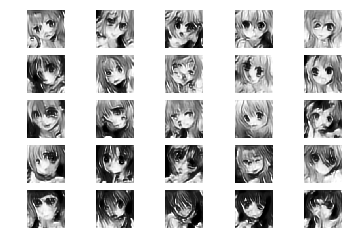

[Epoch   9] DL: 1.13, GL: 0.82, DR: 0.59, GR: 0.49, TI: 0.00, GI: 0.07


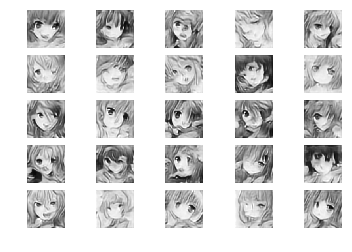

[Epoch  10] DL: 1.08, GL: 0.77, DR: 0.63, GR: 0.50, TI: 0.00, GI: 0.04


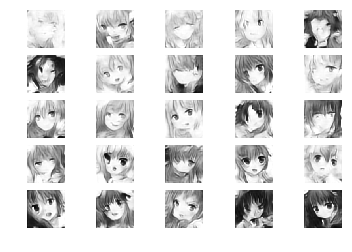

[Epoch  11] DL: 1.12, GL: 0.71, DR: 0.61, GR: 0.53, TI: 0.01, GI: 0.06


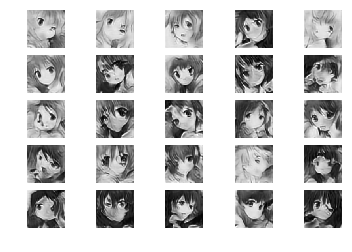

[Epoch  12] DL: 1.19, GL: 0.73, DR: 0.60, GR: 0.51, TI: 0.00, GI: 0.05


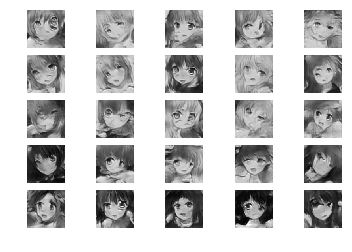

[Epoch  13] DL: 1.11, GL: 0.89, DR: 0.61, GR: 0.44, TI: 0.01, GI: 0.04


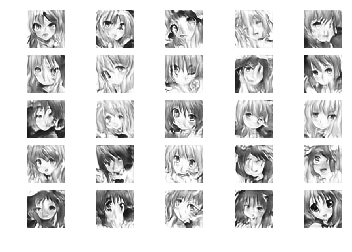

[Epoch  14] DL: 1.10, GL: 0.82, DR: 0.63, GR: 0.47, TI: 0.00, GI: 0.04


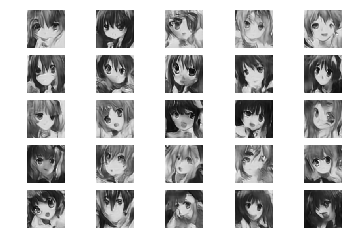

[Epoch  15] DL: 1.15, GL: 0.85, DR: 0.59, GR: 0.46, TI: 0.00, GI: 0.03


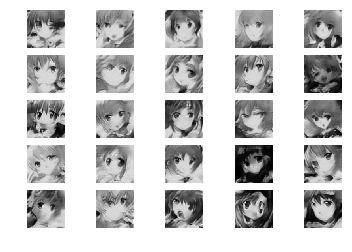

[Epoch  16] DL: 1.13, GL: 0.75, DR: 0.59, GR: 0.50, TI: 0.01, GI: 0.04


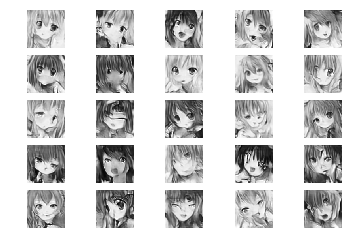

[Epoch  17] DL: 1.11, GL: 0.82, DR: 0.61, GR: 0.47, TI: 0.00, GI: 0.03


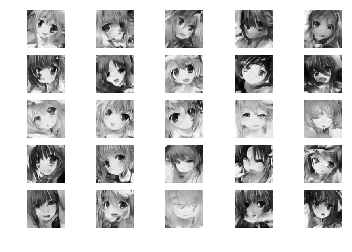

[Epoch  18] DL: 1.63, GL: 0.63, DR: 0.54, GR: 0.56, TI: 0.00, GI: 0.03


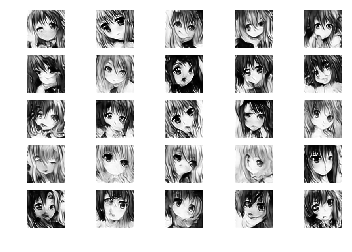

[Epoch  19] DL: 1.24, GL: 0.68, DR: 0.54, GR: 0.53, TI: 0.00, GI: 0.02


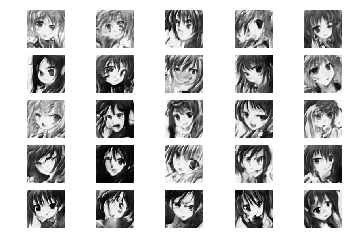

[Epoch  20] DL: 1.14, GL: 0.90, DR: 0.60, GR: 0.44, TI: 0.01, GI: 0.03


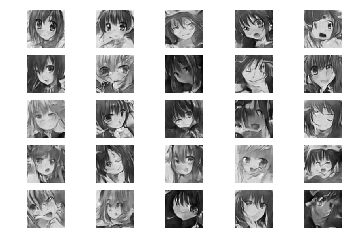

[Epoch  21] DL: 1.13, GL: 0.79, DR: 0.57, GR: 0.48, TI: 0.00, GI: 0.02


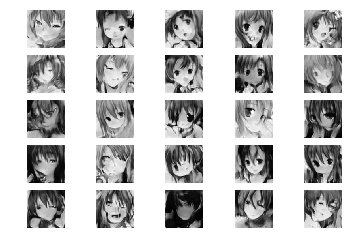

[Epoch  22] DL: 1.12, GL: 0.79, DR: 0.60, GR: 0.48, TI: 0.00, GI: 0.02


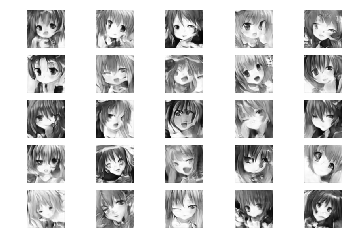

[Epoch  23] DL: 1.12, GL: 0.84, DR: 0.60, GR: 0.45, TI: 0.00, GI: 0.02


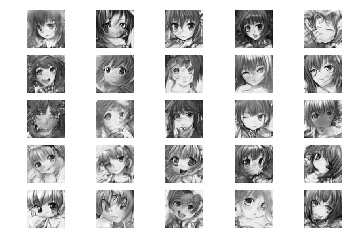

[Epoch  24] DL: 1.15, GL: 0.81, DR: 0.58, GR: 0.46, TI: 0.00, GI: 0.01


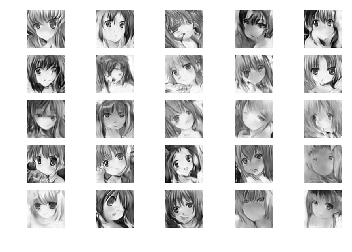

[Epoch  25] DL: 1.14, GL: 0.71, DR: 0.60, GR: 0.51, TI: 0.00, GI: 0.03


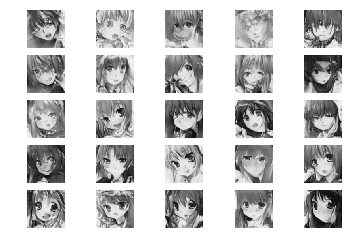

[Epoch  26] DL: 1.14, GL: 0.91, DR: 0.58, GR: 0.43, TI: 0.00, GI: 0.02


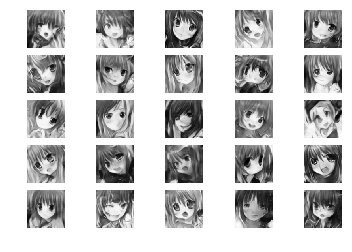

[Epoch  27] DL: 1.17, GL: 0.86, DR: 0.60, GR: 0.46, TI: 0.00, GI: 0.04


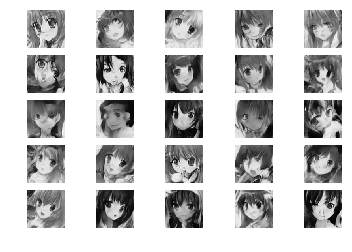

[Epoch  28] DL: 1.18, GL: 0.79, DR: 0.55, GR: 0.48, TI: 0.00, GI: 0.01


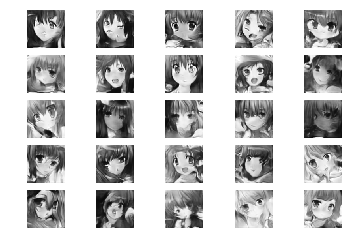

[Epoch  29] DL: 1.14, GL: 0.81, DR: 0.60, GR: 0.46, TI: 0.00, GI: 0.01


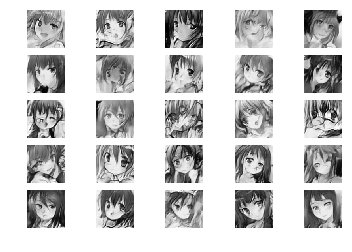

[Epoch  30] DL: 1.13, GL: 0.72, DR: 0.58, GR: 0.51, TI: 0.00, GI: 0.02


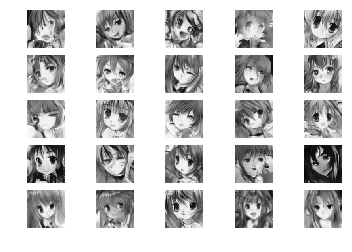

[Epoch  31] DL: 1.10, GL: 0.77, DR: 0.61, GR: 0.49, TI: 0.02, GI: 0.03


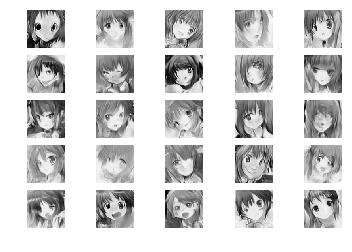

[Epoch  32] DL: 1.15, GL: 0.93, DR: 0.58, GR: 0.42, TI: 0.00, GI: 0.02


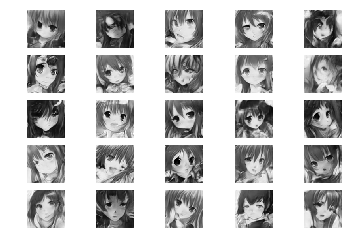

[Epoch  33] DL: 1.11, GL: 0.76, DR: 0.61, GR: 0.49, TI: 0.01, GI: 0.02


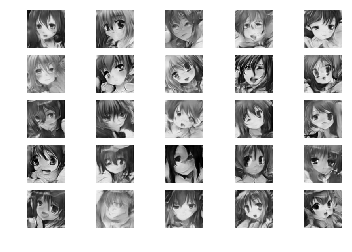

[Epoch  34] DL: 1.17, GL: 0.81, DR: 0.56, GR: 0.47, TI: 0.00, GI: 0.03


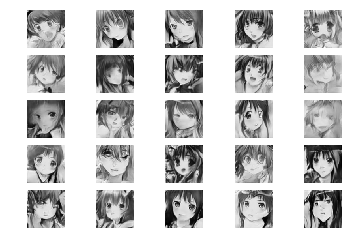

[Epoch  35] DL: 1.17, GL: 0.80, DR: 0.56, GR: 0.47, TI: 0.00, GI: 0.02


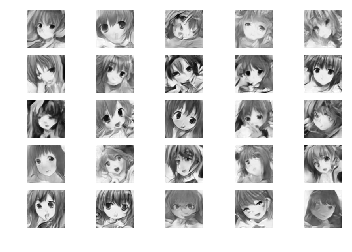

[Epoch  36] DL: 1.15, GL: 0.86, DR: 0.58, GR: 0.46, TI: 0.00, GI: 0.04


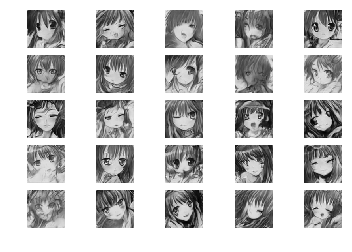

[Epoch  37] DL: 1.16, GL: 0.75, DR: 0.59, GR: 0.49, TI: 0.01, GI: 0.02


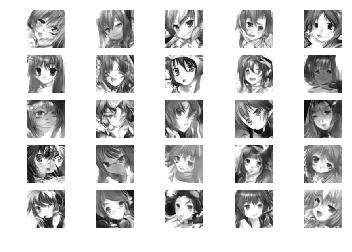

[Epoch  38] DL: 1.15, GL: 0.80, DR: 0.61, GR: 0.48, TI: 0.00, GI: 0.04


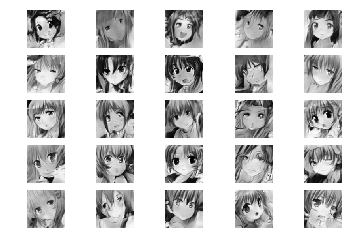

[Epoch  39] DL: 1.16, GL: 0.71, DR: 0.60, GR: 0.51, TI: 0.00, GI: 0.02


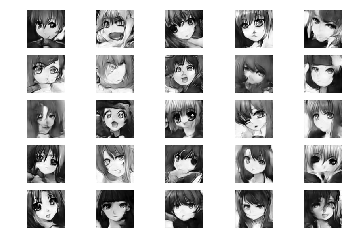

[Epoch  40] DL: 1.17, GL: 0.76, DR: 0.57, GR: 0.49, TI: 0.00, GI: 0.01


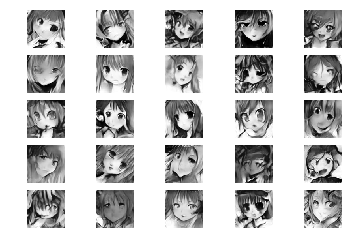

[Epoch  41] DL: 1.16, GL: 0.79, DR: 0.57, GR: 0.48, TI: 0.00, GI: 0.03


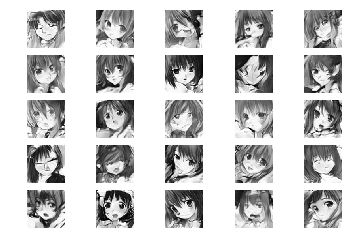

[Epoch  42] DL: 1.14, GL: 0.74, DR: 0.62, GR: 0.50, TI: 0.00, GI: 0.02


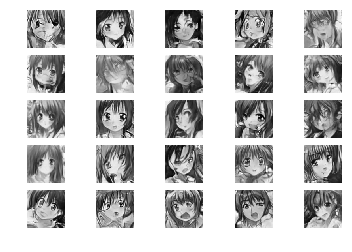

[Epoch  43] DL: 1.14, GL: 0.81, DR: 0.60, GR: 0.46, TI: 0.00, GI: 0.01


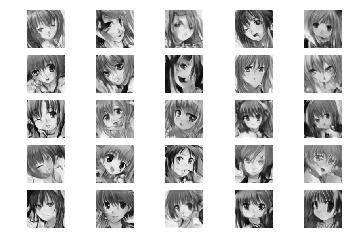

[Epoch  44] DL: 1.17, GL: 0.85, DR: 0.58, GR: 0.46, TI: 0.00, GI: 0.03


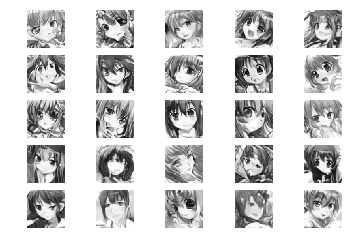

[Epoch  45] DL: 1.15, GL: 0.72, DR: 0.60, GR: 0.51, TI: 0.00, GI: 0.02


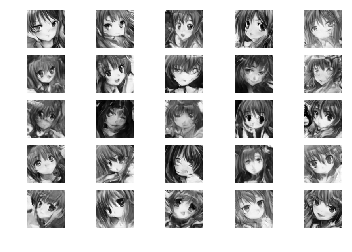

[Epoch  46] DL: 1.18, GL: 0.71, DR: 0.58, GR: 0.52, TI: 0.00, GI: 0.02


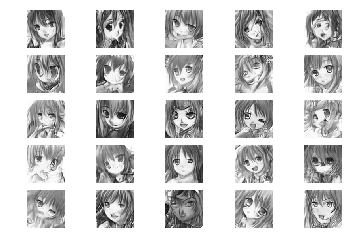

[Epoch  47] DL: 1.19, GL: 0.80, DR: 0.54, GR: 0.48, TI: 0.00, GI: 0.03


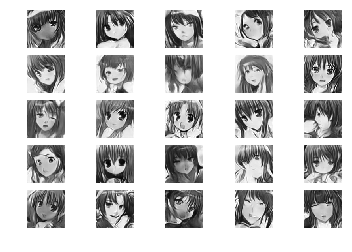

[Epoch  48] DL: 1.15, GL: 0.84, DR: 0.57, GR: 0.46, TI: 0.00, GI: 0.04


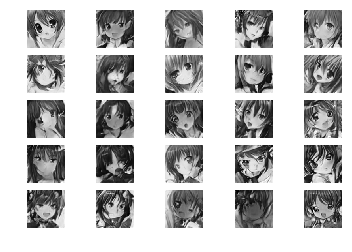

[Epoch  49] DL: 1.11, GL: 0.78, DR: 0.60, GR: 0.48, TI: 0.00, GI: 0.01


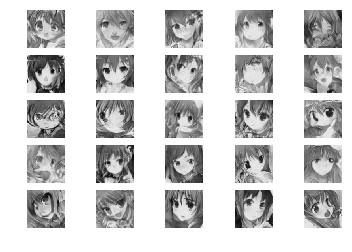

[Epoch  50] DL: 1.14, GL: 0.77, DR: 0.58, GR: 0.49, TI: 0.00, GI: 0.02


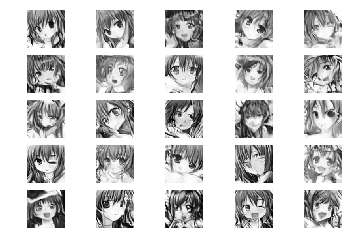

[Epoch  51] DL: 1.11, GL: 0.81, DR: 0.59, GR: 0.47, TI: 0.00, GI: 0.01


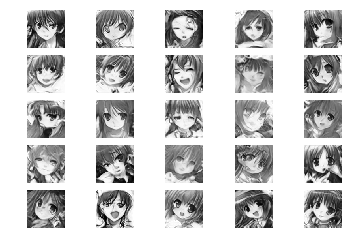

[Epoch  52] DL: 1.17, GL: 0.86, DR: 0.56, GR: 0.45, TI: 0.00, GI: 0.03


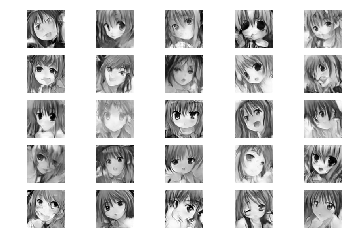

[Epoch  53] DL: 1.14, GL: 0.79, DR: 0.58, GR: 0.47, TI: 0.00, GI: 0.01


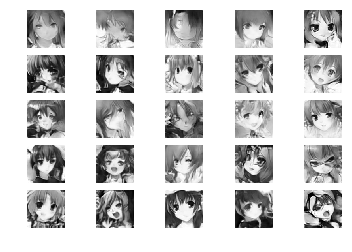

[Epoch  54] DL: 1.13, GL: 0.82, DR: 0.59, GR: 0.47, TI: 0.00, GI: 0.02


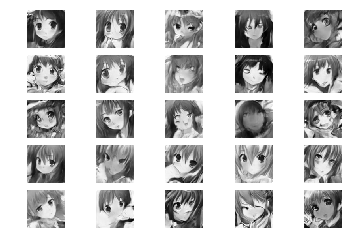

[Epoch  55] DL: 1.12, GL: 0.75, DR: 0.60, GR: 0.50, TI: 0.00, GI: 0.02


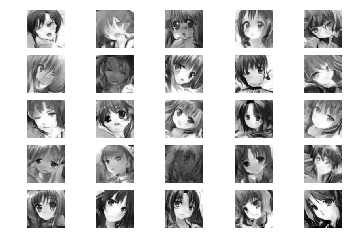

[Epoch  56] DL: 1.10, GL: 0.89, DR: 0.60, GR: 0.44, TI: 0.00, GI: 0.03


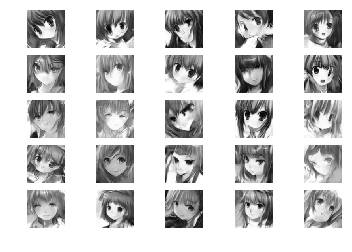

[Epoch  57] DL: 1.10, GL: 0.90, DR: 0.62, GR: 0.45, TI: 0.00, GI: 0.02


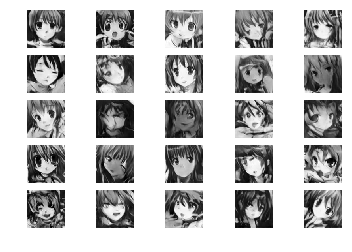

[Epoch  58] DL: 1.16, GL: 0.77, DR: 0.58, GR: 0.48, TI: 0.00, GI: 0.01


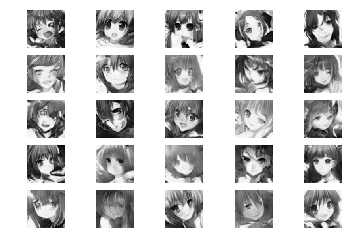

[Epoch  59] DL: 1.10, GL: 0.77, DR: 0.62, GR: 0.49, TI: 0.00, GI: 0.02


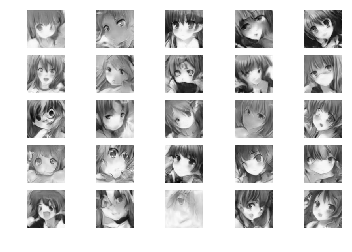

[Epoch  60] DL: 1.14, GL: 1.11, DR: 0.59, GR: 0.37, TI: 0.00, GI: 0.02


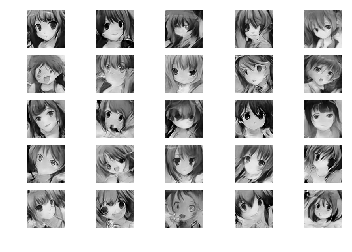

[Epoch  61] DL: 1.08, GL: 0.85, DR: 0.59, GR: 0.46, TI: 0.00, GI: 0.03


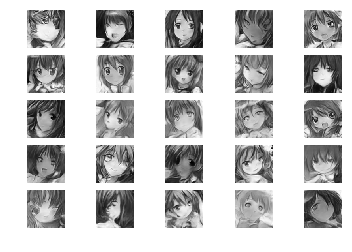

[Epoch  62] DL: 1.13, GL: 0.75, DR: 0.58, GR: 0.49, TI: 0.00, GI: 0.02


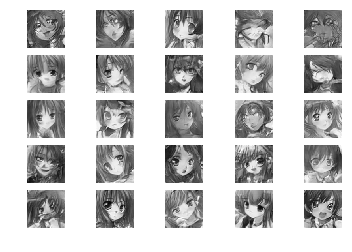

[Epoch  63] DL: 1.12, GL: 0.73, DR: 0.62, GR: 0.50, TI: 0.00, GI: 0.01


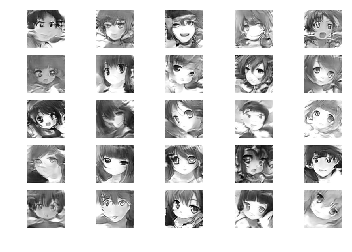

[Epoch  64] DL: 1.10, GL: 0.97, DR: 0.61, GR: 0.40, TI: 0.00, GI: 0.01


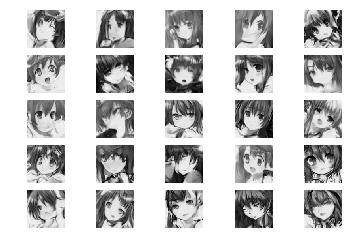

[Epoch  65] DL: 1.04, GL: 0.84, DR: 0.63, GR: 0.45, TI: 0.00, GI: 0.01


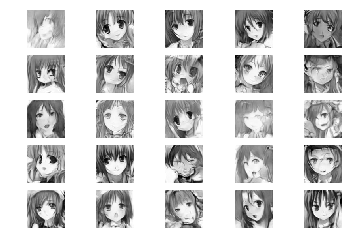

[Epoch  66] DL: 1.09, GL: 0.86, DR: 0.57, GR: 0.45, TI: 0.00, GI: 0.01


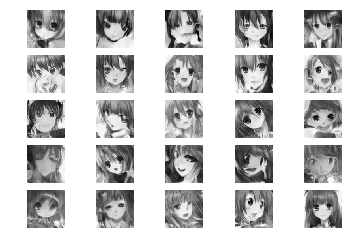

[Epoch  67] DL: 1.03, GL: 0.88, DR: 0.63, GR: 0.44, TI: 0.00, GI: 0.02


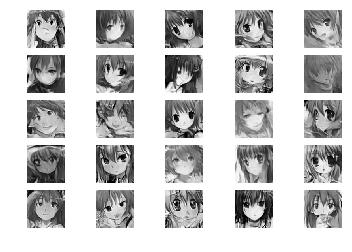

[Epoch  68] DL: 1.08, GL: 0.87, DR: 0.61, GR: 0.44, TI: 0.00, GI: 0.01


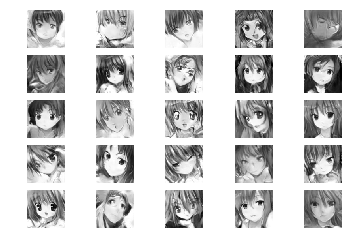

[Epoch  69] DL: 1.07, GL: 0.75, DR: 0.62, GR: 0.50, TI: 0.00, GI: 0.02


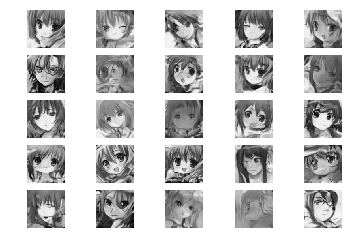

[Epoch  70] DL: 1.08, GL: 1.02, DR: 0.59, GR: 0.39, TI: 0.00, GI: 0.02


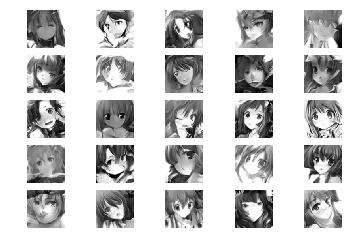

[Epoch  71] DL: 1.10, GL: 0.93, DR: 0.60, GR: 0.43, TI: 0.00, GI: 0.03


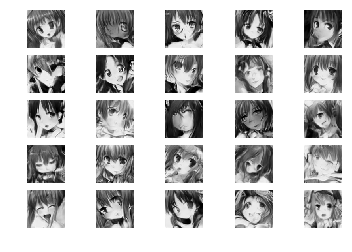

[Epoch  72] DL: 1.08, GL: 0.90, DR: 0.61, GR: 0.43, TI: 0.00, GI: 0.01


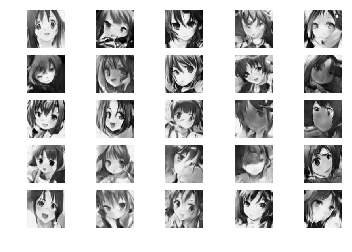

[Epoch  73] DL: 1.07, GL: 0.89, DR: 0.62, GR: 0.44, TI: 0.00, GI: 0.03


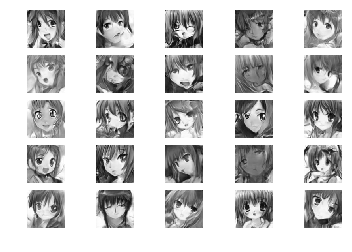

[Epoch  74] DL: 1.07, GL: 0.92, DR: 0.63, GR: 0.43, TI: 0.00, GI: 0.01


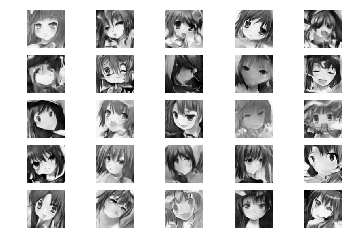

[Epoch  75] DL: 1.08, GL: 0.90, DR: 0.59, GR: 0.44, TI: 0.00, GI: 0.02


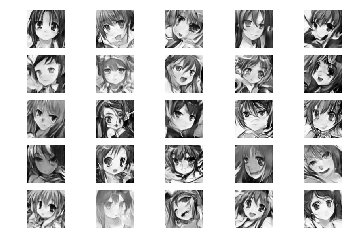

[Epoch  76] DL: 1.04, GL: 0.80, DR: 0.62, GR: 0.47, TI: 0.00, GI: 0.01


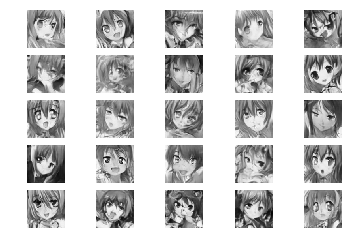

[Epoch  77] DL: 1.06, GL: 1.46, DR: 0.62, GR: 0.32, TI: 0.00, GI: 0.01


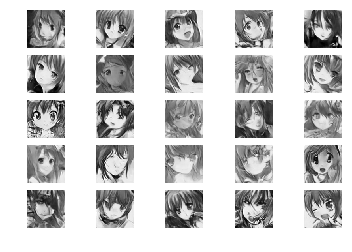

[Epoch  78] DL: 1.03, GL: 0.86, DR: 0.62, GR: 0.46, TI: 0.00, GI: 0.03


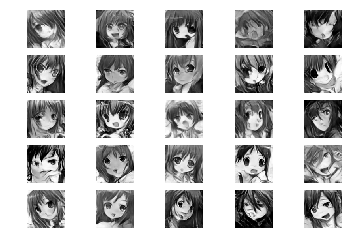

[Epoch  79] DL: 1.06, GL: 0.85, DR: 0.62, GR: 0.46, TI: 0.00, GI: 0.02


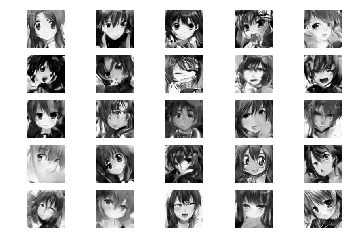

[Epoch  80] DL: 1.01, GL: 0.93, DR: 0.64, GR: 0.42, TI: 0.00, GI: 0.01


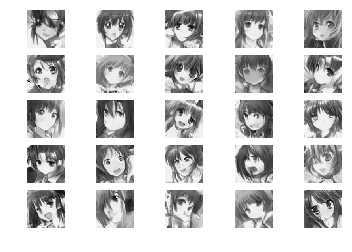

[Epoch  81] DL: 1.04, GL: 0.85, DR: 0.63, GR: 0.46, TI: 0.00, GI: 0.02


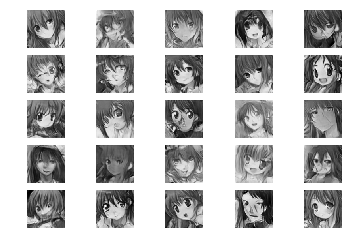

[Epoch  82] DL: 1.03, GL: 0.90, DR: 0.62, GR: 0.44, TI: 0.00, GI: 0.01


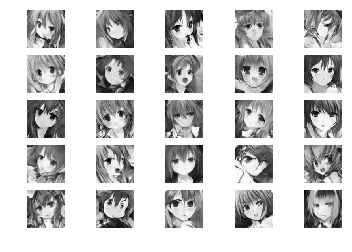

[Epoch  83] DL: 1.07, GL: 0.91, DR: 0.61, GR: 0.44, TI: 0.00, GI: 0.02


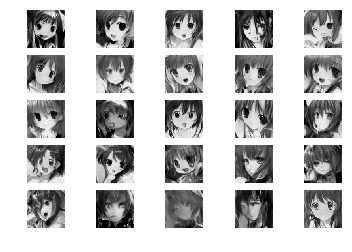

[Epoch  84] DL: 1.01, GL: 0.94, DR: 0.63, GR: 0.42, TI: 0.00, GI: 0.02


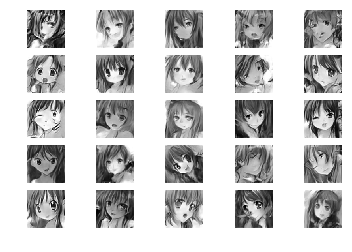

[Epoch  85] DL: 1.00, GL: 0.95, DR: 0.62, GR: 0.42, TI: 0.00, GI: 0.02


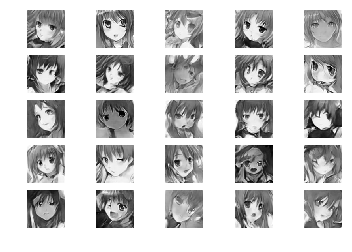

[Epoch  86] DL: 1.02, GL: 0.92, DR: 0.61, GR: 0.43, TI: 0.00, GI: 0.01


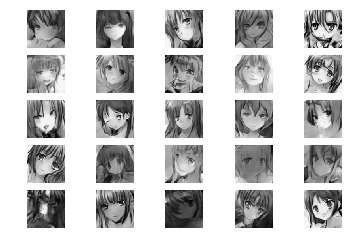

[Epoch  87] DL: 1.01, GL: 0.97, DR: 0.64, GR: 0.41, TI: 0.01, GI: 0.02


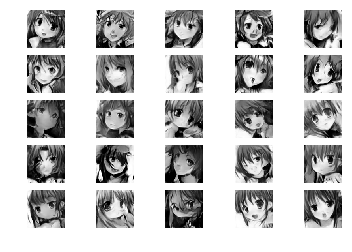

[Epoch  88] DL: 1.04, GL: 0.95, DR: 0.62, GR: 0.42, TI: 0.00, GI: 0.03


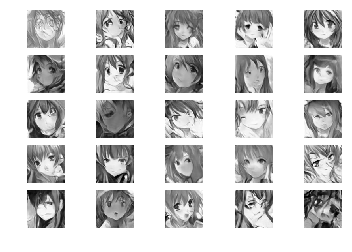

[Epoch  89] DL: 1.05, GL: 0.91, DR: 0.61, GR: 0.44, TI: 0.00, GI: 0.02


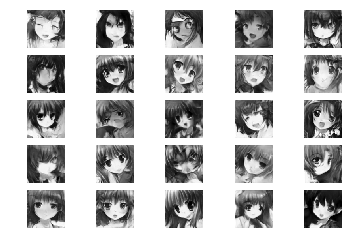

[Epoch  90] DL: 1.02, GL: 0.88, DR: 0.61, GR: 0.44, TI: 0.00, GI: 0.02


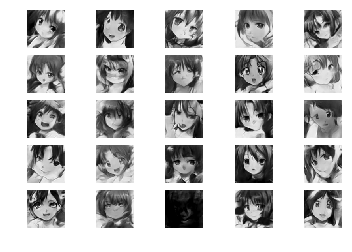

[Epoch  91] DL: 0.98, GL: 0.92, DR: 0.64, GR: 0.43, TI: 0.00, GI: 0.01


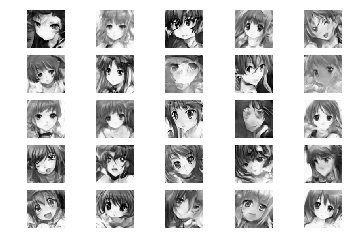

[Epoch  92] DL: 0.97, GL: 1.06, DR: 0.64, GR: 0.37, TI: 0.00, GI: 0.01


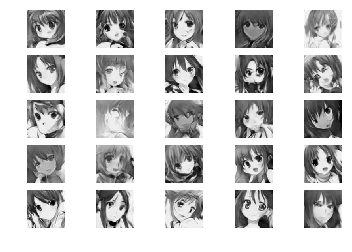

[Epoch  93] DL: 1.04, GL: 0.87, DR: 0.62, GR: 0.44, TI: 0.00, GI: 0.01


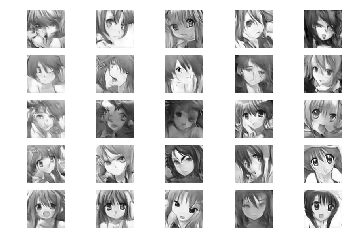

[Epoch  94] DL: 1.00, GL: 0.92, DR: 0.62, GR: 0.43, TI: 0.00, GI: 0.02


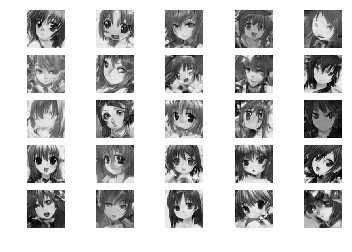

[Epoch  95] DL: 0.95, GL: 0.98, DR: 0.64, GR: 0.41, TI: 0.00, GI: 0.02


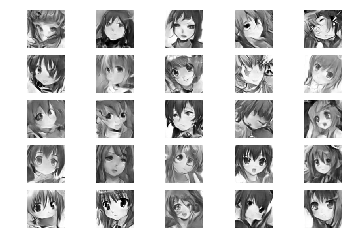

[Epoch  96] DL: 0.92, GL: 0.99, DR: 0.65, GR: 0.41, TI: 0.00, GI: 0.02


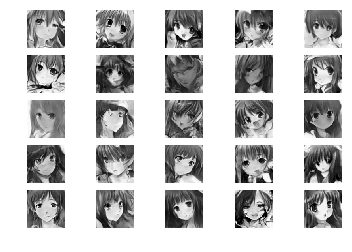

[Epoch  97] DL: 0.89, GL: 1.00, DR: 0.66, GR: 0.40, TI: 0.00, GI: 0.01


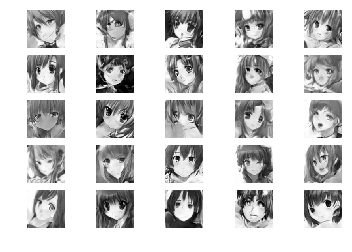

[Epoch  98] DL: 0.89, GL: 0.82, DR: 0.67, GR: 0.47, TI: 0.00, GI: 0.01


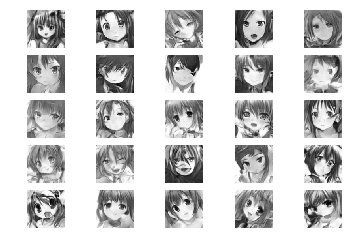

[Epoch  99] DL: 0.90, GL: 0.94, DR: 0.67, GR: 0.42, TI: 0.00, GI: 0.01


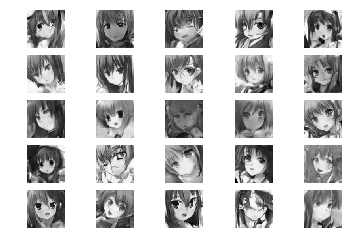

In [5]:
# Start training
epochs = 100
try:
    for epoch in range(epochs):
        #clear_output()
        logs = model.fit(training_data)
        logs = ', '.join(map(str, logs))
        print ("[Epoch {:3d}] {}".format(epoch, logs))
        gen_show_imgs(model)
        save_model(epoch, model)
        #break
            
except KeyboardInterrupt:
    print ('KeyboardInterrupt')